---
title: 👩‍💻Chord Graph
description: HoloView를 이용하여 Chord Graph 그리기
date: "2023-06-18"
categories: [chord, visualization, code]
toc: true
image: ../../images/chord5.png
execute:
  freeze: auto 
---

이전 **Accessibility-Based Clustering for Efficient Learning of Locomotion Skills** 논문을 [리뷰](https://curieuxjy.github.io/posts/paper/2023-05-07-accessibility.html)하면서 로봇의 static pose들을 가지고 [K-Acc Clustering하는 과정](https://curieuxjy.github.io/posts/paper/2023-05-07-accessibility.html#clustering) 이후에 Clustering Analysis에서 **Inter-cluster accessibility**를 Visulization을 하는 부분이 있었습니다. 

![](../../images/2023-05-07-accessibility/13.png)

오른쪽에 보이는 그래프가 **Hord Graph**인데 각 Top-20 cluster에 속한 sample pose들을 하나의 `node`로 표현하고 각 sample pose들이이 다른 pose로 transition되는 과정에서 accessiblity 값이 높은 부분은 **진한** `edge`로 accessibility가 낮은 부분은 **옅은** `edge`로 그려서 연결성을 보여줍니다. 따라서 이런 시각화를 통해 cluster 간의 inter-cluster accessibility를 표현할 수 있는 것 입니다.(자세한 내용은 이전 논문 리뷰 포스팅을 참고 바랍니다.) 이번 포스팅은 바로 이 **Chord graph**를 **Holoviews**라는 파이썬 패키지를 이용해서 시각화 하는 방법에 대해 다룰 것 입니다.

# Chord Diagram

**CHORD DIAGRAM**란 무엇일까요? Chord Diagram은 여러 개체(node) 간의 **흐름이나 연결**과 같음 상호 관계를 시각적으로 나타내는 다이어그램 입니다. 각 데이터(개체)는 원 형태로 원주에 따라 원형 배치되며 데이터 포인트 간의 관계는 일반적으로 데이터를 연결하는 호(arc/edge)로 그려집니다. 각 호가 개체간의 흐름과 연결을 표현하는 것이고 따라서 방향성이 존재하기 때문에 각 노드에 대한 **출발(source)과 도착(target)** 정보가 있어야 다이어그램을 그릴 수 있습니다. 그래서 chord diagram으로 시각화 하기 좋은 정보는 **이동성/변화/흐름**와 같은 데이터셋이라고 볼 수 있습니다. 따라서 Chord Diagram은 이주 연구, 경제적 흐름, 그리고 유전체 연구 등에서 인기가 있는 시각화 방법이며 탐색되지 않은 관계를 강조하여 필터 버블(filter bubbles) 문제를 해결하는 데 도움을 줍니다. 한가지 예시로는 아래와 같이 대륙별 사람들의 이동성을 보여주는 도표를 볼 수 있습니다.


![](../../images/chord1.png)

# Holoviews

[Holoviews](https://holoviews.org/index.html#)라는 파이썬 시각화 패키지를 이용해서 본격적으로 Chord 그래프를 그려보기 전에, 우선 **Holoviews가 어떤 패키지인지** 알아보겠습니다.

> Stop plotting your data - annotate your data and let it visualize itself

위와 같은 캐치프레이즈로 만들어진 오픈소스 라이브러리로 데이터 분석과 시각화를 원활하고 간단하게 수행할 수 있도록 하는 것을 목표로 합니다. Holoviews는 데이터를 그래프나 차트로 바로 변환하는 대신, **데이터 자체를** 추상화한 객체로 다루고 이를 시각화로 변환하는 방식을 취합니다. 이 객체를 `요소(element)`라고 부르며, Holoviews는 이러한 요소들을 조합하여 다양한 그래프를 생성합니다. Holoviews를 사용하면 몇 줄의 코드로 다양한 유형의 그래프를 생성할 수 있습니다. 예를 들어, **선 그래프, 산점도, 막대 그래프, 히트맵 등**을 손쉽게 만들 수 있습니다. 또한, Holoviews는 다른 시각화 라이브러리인 **Matplotlib, Bokeh, Plotly**와 함께 사용할 수 있어 더 많은 기능과 유연성을 제공합니다. Holoviews는 `다양한 데이터 타입`을 지원하며, **NumPy 배열, Pandas 데이터프레임, xarray 데이터셋 등**과 같은 다양한 형식의 데이터를 처리할 수 있습니다. 또한, **상호작용적인 그래프**를 생성할 수 있어 사용자가 그래프를 탐색하고 조작할 수 있는 기능도 제공합니다.

이러한 holoviews 패키지를 이용하기 위해서는 아래와 같이 command를 실행하면 해당 파이썬 패키지가 설치됩니다.

```
pip install holoviews
```

**Holoviews 패키지를 사용한 이유**

Chord graph를 그리기 위한 파이썬 패키지는 Holoviews외에도 다양합니다. 또한 원논문에서 사용한 chord grpah를 그리기 위해 활용한 패키지도 holoviews가 아닙니다. 그럼에도 이번 포스팅에서 holoviews를 이용해서 chord graph를 그리는 법을 소개하는 이유는, 원저자가 사용했던 패키지(공개된 코드나 논문에 명시되어 있지는 않지만 저자에게 직접 여쭤봤었을 때 [plotapi](https://plotapi.com/)로 확인할 수 있었음)는 무료에서 *유료화로 전환*되어 사용하기 어려워졌고, 다른 파이썬 패키지들은 holoviews보다 사용하기 어렵거나 다른 시각화 라이브러리들과 호환성이 좋지 않기 때문입니다. 하지만 Holoviews의 단점으로 논문의 chord graph를 완벽하게 재현하기 힘든 부분이 있습니다. 앞서 **진한/옅은** `edge`의 표현이 accessiblity의 값에 따라 `edge`의 **transparency(alpha)값을 조절**하는 option을 holoviews에서 제공되지 않습니다. 따라서 이후 실습에서 `edge_alpha`값을 조절하는 부분을 제외한 모든 시각화 절차에 대해서 설명할 예정입니다.

# Simple Chord Example

Holoviews에서 제공하는 [비행기 항공편 예제](https://holoviews.org/gallery/demos/bokeh/route_chord.html)로 Chord Graph에 대해서 본격적으로 살펴보겠습니다. 비행기의 이동경로는 **출발지**와 **도착지**가 있기 때문에 Chord graph로 그리기에 적절한 데이터셋이라고 할 수 있습니다. 우선 [예제 데이터](https://docs.bokeh.org/en/3.1.0/docs/first_steps/installation.html#installing-sample-data)를 bokeh에서 다운로드를 합니다.

```python
import bokeh
bokeh.sampledata.download()
```

필요한 Holoviews의 모듈들을 설치하고 다운받은 bokeh 예제 데이터들 중에서 **비행기 항공편**을 보여주는 `routes`와 **공항**에 대한 정보를 보여주는 `airports`를 불러옵니다.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
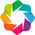

In [2]:
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.airport_routes import routes, airports

hv.extension('bokeh')

![](../../images/chord2.png)

`routes` Dataframe 정보를 살펴보면 출발지에 대한 정보를 담고 있는 **SourceID** 열과 도착지에 대한 정보를 담고 있는 **DestinationID** 열을 확인할 수 있습니다.

In [3]:
routes.head(4)

,Airline,AirlineID,Source,SourceID,Destination,DestinationID,Codeshare,Stops,Equipment
0,2O,146,ADQ,3531,KLN,7162,NaN,0,BNI
1,2O,146,KLN,7162,KYK,7161,NaN,0,BNI
2,3E,10739,BRL,5726,ORD,3830,NaN,0,CNC
3,3E,10739,BRL,5726,STL,3678,NaN,0,CNC


`airports` Dataframe 정보를 살펴보면 각 공항의 아이디 정보를 담고 있는 **AirportID** 열과 각 공항이 존재하는 도시이름을 알려주는 **City** 열을 확인할 수 있습니다.

In [4]:
airports.head(3)

,AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ,Type,source
0,3411,Barter Island LRRS Airport,Barter Island,United States,BTI,PABA,70.134003,-143.582001,2,-9,A,America/Anchorage,airport,OurAirports
1,3413,Cape Lisburne LRRS Airport,Cape Lisburne,United States,LUR,PALU,68.875099,-166.110001,16,-9,A,America/Anchorage,airport,OurAirports
2,3414,Point Lay LRRS Airport,Point Lay,United States,PIZ,PPIZ,69.732903,-163.005005,22,-9,A,America/Anchorage,airport,OurAirports


::: {.callout-tip icon="false" collapse="true" }

### airports.info()

```
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1435 entries, 0 to 1434
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AirportID  1435 non-null   int64  
 1   Name       1435 non-null   object 
 2   City       1435 non-null   object 
 3   Country    1435 non-null   object 
 4   IATA       1435 non-null   object 
 5   ICAO       1435 non-null   object 
 6   Latitude   1435 non-null   float64
 7   Longitude  1435 non-null   float64
 8   Altitude   1435 non-null   int64  
 9   Timezone   1435 non-null   object 
 10  DST        1435 non-null   object 
 11  TZ         1435 non-null   object 
 12  Type       1435 non-null   object 
 13  source     1435 non-null   object 
dtypes: float64(2), int64(2), object(10)
memory usage: 157.1+ KB
```

:::

각 공항에 편성되어 있는 경로수를 `groupby`함수를 통해 집계를 하고, **airports**의 DataFrame에서 `AirportID`와 `City`열을 추출하여 holoview의 `Dataset` 객체로 `nodes`개체를 생성합니다. 

In [5]:
# edge(혹은 arc) 정보
route_counts = routes.groupby(['SourceID', 'DestinationID']).Stops.count().reset_index()
# node 정보
nodes = hv.Dataset(airports, 'AirportID', 'City')

In [9]:
route_counts.head(3)

,SourceID,DestinationID,Stops
0,3411,3420,1
1,3411,3620,1
2,3413,3693,1


루트 정보로 만든 `route_counts` 데이터셋은 **edge(link)**로, 공항 정보로 만든 `nodes` 데이터셋은 **node**로 `hv.Chord` 객체의 인풋으로 넣어주게 됩니다. 2번째 argument로는 `source`와 `target`이 edge 데이터셋에서 각각 어떤 열을 참조해야 하는지를 명시하고 edge의 수는 `Stops`열을 참조하도록 3번째 argument에 명시해줍니다. 이때 `source`와 `target`은 `nodes` 데이터셋과 매칭되는 ID이어야 한다는 점을 주의해야 합니다.

In [11]:
chord = hv.Chord((route_counts, nodes), ['SourceID', 'DestinationID'], ['Stops'])

모든 공항을 시각화하려면 앞서 `airports`데이터 프레임 정보에서 나와있는 1435개의 공항 정보들을 시각화하게 되는데 이는 시각화해도 의미있는 인사이트를 얻기 힘들기 때문에 가장 편성된 루트가 많은 20개의 busiest airport를 선정하여 나타내도록 하겠습니다.

In [13]:
# Select the 20 busiest airports
busiest = list(routes.groupby('SourceID').count().sort_values('Stops').iloc[-20:].index.values)
busiest_airports = chord.select(AirportID=busiest, selection_mode='nodes')

In [14]:
busiest_airports

:Chord   [SourceID,DestinationID]   (Stops)

chord 그래프의 옵션을 추가하여 그래프의 크기와 색깔맵, 공항 이름 등을 표시하고 각 노드와 엣지의 색도 해당하는 공항을 잘 보여줄 수 있도록 `SourceID`에 중점으로 색을 선정하여 시각화하면 아래와 같이 그려집니다.

In [10]:
busiest_airports.opts(
    opts.Chord(cmap='Category20',
               width=500,
               height=500, 
               labels='City',
               edge_color=dim('SourceID').str(), 
               node_color=dim('AirportID').str(), 
               ))

:Chord   [SourceID,DestinationID]   (Stops)

# K-Acc Inter-cluster Chord

지금까지 Holoviews를 이용하여 Chord diagram을 그려보는 것을 예제를 통해 파악할 수 있었습니다. 지금부터는 연구실에서 사용하고 있는 **AiDIN-VIII이라는 사족보행로봇 플랫폼**을 가지고 논문에서 나와있었던 Accessibility를 계산하고 centroid poses들에 대해서 chord diagram을 그려보는 과정을 따라가보겠습니다. 샘플링한 Static poses들을 2000개를 `poses.pickle` 데이터로 저장해놨습니다. 각 pose-to-pose를 PD tracking을 하며 걸리는 시간을 측정하게 되는데 pose-to-pose로 transition되는 시간은 1초가될 수 있도록 joint trajectory를 만들어주고 PD제어를 하면서 0.0025초 마다 destination pose로 도달했는지(시뮬레이터의 `dt`)를 체크합니다. 이때 무한정 시간을 잴 수는 없기 때문에 10초로 시간을 제한하여 최대 10초까지만 걸리는 시간을 기록하게 됩니다.

![](../../images/chord3.png)

이 정보가 총 2000개 샘플 포즈에 대해서 1:1로 모두 구해야 하기때문에 병렬계산을 해서 저장하여 총 75개의 `npy`데이터로 나누어 계산하였고 이를 2000 by 2000 매트릭스로 만들어서 **AccessTimeTable**을 시각화하면 아래와 같이 그려집니다.

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle5 
with open('../poses.pickle', 'rb') as handle: poses = pickle5.load(handle)
# 불러올 npy 파일 이름들을 리스트로 만들어줍니다.
accessTimeFiles = ['accessTimeTableAidin%d.npy'%x for x in range(75)]

In [60]:
timeMat = np.sum([np.load(f) for f in accessTimeFiles], axis=0)
# 자기자신 pose로부터 자기자신의 pose로의 시간은 0초로 처리하기 위해 대각선의 매트릭스 값은 0으로 일괄 처리합니다.
timeMat[ range(len(timeMat)), range(len(timeMat)) ]= 0 

In [61]:
timeMat # shape: (2000, 2000)

array([[ 0.   ,  1.245, 10.   , ...,  1.145, 10.   , 10.   ],
       [10.   ,  0.   ,  1.555, ...,  0.955,  1.31 , 10.   ],
       [10.   ,  3.09 ,  0.   , ..., 10.   , 10.   , 10.   ],
       ...,
       [10.   ,  0.965,  2.035, ...,  0.   , 10.   , 10.   ],
       [ 1.345,  1.015, 10.   , ...,  1.145,  0.   , 10.   ],
       [10.   , 10.   ,  1.4  , ..., 10.   , 10.   ,  0.   ]])

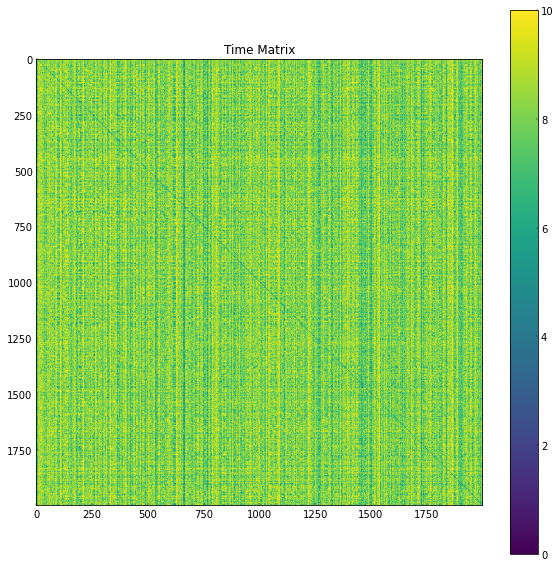

In [62]:
fig = plt.figure(figsize=(10,10))
plt.imshow(timeMat)
plt.title("Time Matrix")
plt.colorbar()
plt.show()
plt.close()

10초 이하로 측정되었던 time data와 10초 이상으로 측정된 time data의 수를 살펴보면 아래와 같습니다. 

In [63]:
np.sum(timeMat < 9.999)

907572

In [64]:
np.sum(timeMat >= 9.999)

3092428

이러한 `timeMat`를 Accessiblity 공식에 맞게 다시 계산하게 됩니다. 이때 10초 이상이 되는 데이터는 `1e-8`으로 만들어서 가장 낮은 accessiblity 점수를 얻도록 처리합니다.

In [67]:
acc_matrix = (timeMat < 9.999) * np.exp(-timeMat/10) + (timeMat >= 9.999) * 1e-8

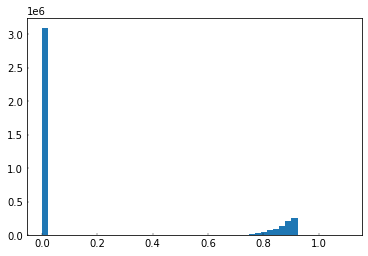

In [68]:
values = np.reshape(acc_matrix,(-1,)) # 2000 x 2000 = 4000k
ax = plt.hist(values, bins=50, range=(-1e-4,1.1))
plt.show()

무한대 시간이 걸렸던 부분을 제외하고 히스토그램을 그려보면 아래와 같습니다.

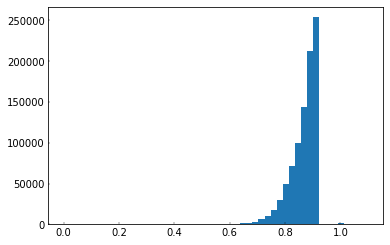

In [69]:
ax = plt.hist(values, bins=50, range=(+1e-4,1.1))
plt.show()

## K-Acc algorithm

논문에서 소개된 K-Acc 알고리즘은 원저자가 공개한 [코드](https://github.com/zita-ch/K-Access)를 그대로 사용하여 AiDIN-VIII 데이터에 적용했습니다.

In [70]:
class K_access:
    def __init__(self, access, k=2, seed=123):
        self.seed = seed
        np.random.seed(self.seed)
        self.k = k # 클래스 수 
        self.access = access # weight_matrix
        self.node_num = len(access) 
        self.access[range(self.node_num),range(self.node_num)] = 1 # 대각 성분을 1로
        self.core_index = np.zeros((k,), dtype=int) 
        self.core_index[0] = np.random.randint(0, self.node_num, (1,)) # 클래스 범위 내에 랜덤한 정수를 코어 인덱스로 설정

        for i in range(1, k):
            ready_core_access = np.sum(self.access[self.core_index[:i],:], axis=0) \
                                + np.sum(self.access[:,self.core_index[:i]], axis=1)
            ready_core_access[self.core_index[:i]] += 999999 # accessible to self
            self.core_index[i] = np.argmin(ready_core_access) # the one that is the farthest from 
            
        self.assignment = np.zeros((self.node_num,),dtype=int)
        self.labels = np.zeros((self.node_num,),dtype=int)
        self.cores_sorted = np.zeros((self.node_num,),dtype=int)
        self.max_iter = 10000
        
        self.assign()        
            
    def assign(self):
        # from core to nodes
        core_access = self.access[self.core_index] 
        # argmax access(core,node)
        self.assignment = self.core_index[np.argmax(core_access, axis = 0)] 
        for c in self.core_index:
            self.assignment[c] = c  # self belongs to self
        return
    
    def update(self):
        for i in range(self.k):
            Si = np.where(self.assignment == self.core_index[i])[0]
            access_Si = self.access[Si,:][:,Si]
            minaccess_Si = np.min(access_Si,axis=1)
            self.core_index[i] = Si[np.argmax(minaccess_Si)]
        return        
    
    def fit(self):
        pre_assignment = np.zeros((self.node_num,),dtype=int) - 1
        iter_ = 0
        while np.sum(np.abs(self.assignment - pre_assignment)) != 0 and iter_ < self.max_iter :
            pre_assignment = self.assignment
            iter_ += 1
            self.update()
            self.assign()
        return iter_
            
    def predict(self):
        map_ = {}
        cnt_Si = []
        for i in range(self.k):
            cnt_Si.append(len(np.where(self.assignment == self.core_index[i])[0]))
        sorted_index = (9999 - np.array(cnt_Si)).argsort()  # descending by # samples in clu
        for i in range(self.k):
            map_[self.core_index[sorted_index[i]]] = i+1 # from 1 to # clu
        self.labels = [map_[c] for c in self.assignment]
        cores_sorted = self.core_index[sorted_index]
        return self.labels, cores_sorted 
    
    def inter_access(self):
        cnt_Si = []
        for i in range(self.k):
            cnt_Si.append(len(np.where(self.assignment == self.core_index[i])[0]))
        sorted_index = (9999 - np.array(cnt_Si)).argsort()  # descending by # samples in clu
        all_to_C = self.access[:,:][:,self.core_index[sorted_index]]
        inter_ = np.zeros((self.k,self.k))
        for i in range(self.k):
            Si = np.where(self.assignment == self.core_index[sorted_index[i]])[0]
            Si_to_C = all_to_C[Si,:]
            inter_[i,:] = np.mean(Si_to_C,axis = 0)
            inter_[i,i] = 1
        return inter_
    
    def intra_access(self):
        intra_ = np.zeros((self.k,))
        cnt_Si = []
        for i in range(self.k):
            cnt_Si.append(len(np.where(self.assignment == self.core_index[i])[0]))
        sorted_index = (9999 - np.array(cnt_Si)).argsort()  # descending by # samples in clu
        for i in range(self.k):
            Si = np.where(self.assignment == self.core_index[sorted_index[i]])[0]
            intra_[i] = np.min(self.access[self.core_index[sorted_index[i]],Si],axis=0)
        return intra_
    
    def evaluate(self):
        intra_ = np.mean(np.log(self.intra_access()))
        inter_ = np.mean(np.log(self.inter_access()))
        cnt_Si = []
        for i in range(self.k):
            cnt_Si.append(len(np.where(self.assignment == self.core_index[i])[0]))
        num_one_sample_cluster = len(np.where(np.array(cnt_Si)==1)[0])
        alpha = 1
        # index I
        # larger is better
        score_ = intra_ - inter_ - alpha * num_one_sample_cluster 
        return score_

위의 `K_access` 클래스를 가지고 최적의 클래스 수를 선정하기 위해 `fit`을 클래스 수를 늘려가며 수행합니다. 그랬을 때 155개의 centroid cluster를 가졌을 때 가장 index 점수가 높아 최적의 클래스 수를 선정할 수 있었습니다.

155 14.17499592680445


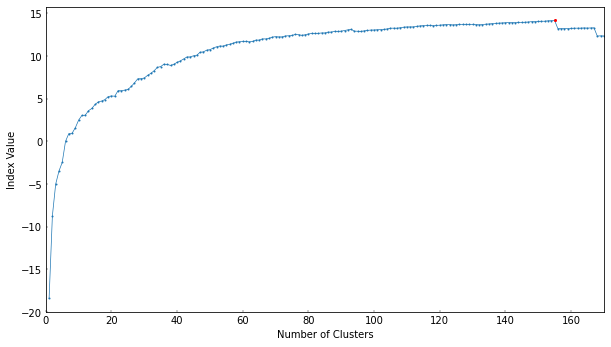

In [71]:
scores = []
n_cls = range(1,201) # 클래스의 수 1 ~ 200까지 조사
for num_class in n_cls:
    k = K_access(acc_matrix, num_class)
    k.fit()
    scores.append(k.evaluate())
    
fig,ax = plt.subplots(figsize=(10, 10*9/16))
max_ind = np.argmax(scores)
print(max_ind+1, scores[max_ind]) # 최적의 클래스 수, 그때의 인데스 점수

plt.plot(n_cls, scores, marker='o', markersize=1)
plt.plot([max_ind+1],[scores[max_ind]],marker='o',c='r',markersize=2)
plt.xlabel('Number of Clusters')
plt.ylabel('Index Value')
plt.xlim([0,170])
plt.show()

선정된 클래스 수를 가지고 다시한번 클러스터링 작업을 거져 각 centroid pose인 `cores`에 대한 정보와 `inter_access`, `intra_access` 점수를 가져올 수 있습니다.

In [72]:
num_class = max_ind+1
k = K_access(acc_matrix, num_class)
k.fit()
clusters, cores = k.predict()
inter_access = k.inter_access()
intra_access = k.intra_access()

In [73]:
cores # centroid pose의 ID

array([1213, 1043, 1150, 1555,  112,  100, 1032,  121,  140, 1097, 1116,
       1554, 1377, 1623,   33,   41,  250,   29, 1272, 1926, 1401,   22,
       1888,  809, 1262,  165, 1513,  108, 1248,  333, 1008,  330, 1081,
        157,  419, 1227, 1231, 1244,  564,  392,  543,   18, 1785,  227,
       1288, 1644, 1715,  398, 1527, 1017,  169, 1056,  139,  323, 1848,
       1121, 1067,  225,  476,  450,  898,    8, 1492, 1223,  467, 1844,
       1608, 1803, 1839, 1913, 1015,   96, 1020,  627, 1526,  691,  268,
       1899, 1521, 1787,    3, 1597,  210,  643,  502, 1358,  209,  798,
       1887, 1216,  332,  972, 1122,  404,  343, 1423,  363,  173, 1544,
          5, 1817,  960,   72, 1832,  853,  446,  479,  395,  650,  313,
       1587,  677,  239, 1089,  464,  891, 1029, 1491, 1477,  761,  860,
       1352, 1564,  938,  645, 1254,   50, 1149,  453, 1791,  777, 1990,
       1737,   47, 1220, 1537,  315, 1180,  162, 1277, 1568,  910,  528,
        523, 1361,  709, 1718, 1045,  618,   86, 18

**각 클러스터마다 포함하고 있는 샘플들의 수는 어떻게 분포하고 있을까요?** 히스토그램으로 시각화를 해보았습니다. 각 샘플들의 수는 이후에 chord diagram의 노드가 될 것 입니다.

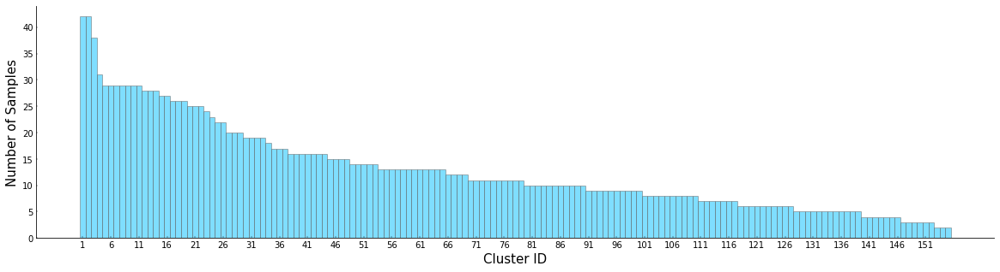

In [76]:
# figure 설정
plt.rcParams['lines.linewidth']=0.7
plt.rcParams['xtick.direction']='in'
plt.rcParams['ytick.direction']='in'
plt.rcParams['xtick.major.width']=0.4
plt.rcParams['ytick.major.width']=0.4
plt.rcParams['xtick.major.size']=2
plt.rcParams['ytick.major.size']=2
fig,ax = plt.subplots(figsize=(20, 5))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax_ = plt.hist(np.array(clusters)-0.5,
               range = [0.5, np.max(clusters)+0.5],
               bins = np.max(clusters),
               edgecolor='dimgray',
               color='deepskyblue',
               rwidth=1,
               alpha=0.5)

ax = plt.xticks(range(1,1+np.max(clusters),5))
plt.xlabel('Cluster ID',fontsize=15)
plt.ylabel('Number of Samples',fontsize=15)
plt.show()

## Get Kacc poses

알고리즘을 통해 선정된 centroid pose들에 대한 정보를 한번 확인해보겠습니다. 각 pose에 대한 정보는 아래와 같은 형식으로 정리해서 가장 많은 샘플 수를 포함하고 있는 **top-3 centroid pose**를 확인해보겠습니다.

```
[
([0,0,height], [ 12 joints], [roll, pitch, 0] ),
]
```

In [77]:
kaccess_config = []
for i in range(np.max(clusters)):
    centroid_pose = poses[cores[i]]
    ele1 = [0,0, centroid_pose['store_height']]
    ele2 = centroid_pose['store_joints']
    ele3 = list(centroid_pose['store_roll_pitch'])+[0]
    ele = (ele1,ele2,ele3)
    kaccess_config.append(ele)

::: {.callout-tip icon="false" collapse="true"}

### Top-3 Centroid pose 정보 확인하기

```
[([0, 0, 0.30607859912101715],
  [0.6053835299386103,
   1.4824030607413299,
   -0.0809348638895901,
   0.3995084366561768,
   1.2970169955948037,
   -0.7264673491159409,
   0.05388458488859648,
   0.33537195041378626,
   -0.24038702044129037,
   -0.501582056954722,
   -1.5199349541933391,
   -0.44053023354145876],
  [3.141592551130548, 0.37124208223469835, 0]),
 ([0, 0, 0.12894579304472167],
  [0.05857655877237639,
   -1.4077772309827037,
   -0.7778225275558831,
   0.1038327197157696,
   -0.7770055977003666,
   -0.9684446036207767,
   0.06583156564999947,
   -0.903642551883172,
   0.3522403885013049,
   -0.6108687315594281,
   0.7353928319105865,
   -0.21053293619245944],
  [-0.412046597574257, 0.043837823368155976, 0]),
 ([0, 0, 0.2968457946843744],
  [0.06337843283646641,
   2.7942809454055157,
   -0.9737491947994557,
   -0.2517691066931858,
   -2.624845950050974,
   -0.18089990597943467,
   -0.17501576141383207,
   0.5877695591500649,
   -0.06264699708493802,
   -0.2039006032557608,
   -1.193152752838448,
   -0.4222694151347171],
  [-1.3562253990942323, 0.0010176328562240375, 0])]
```

:::

![](../../images/chord4.png)

## Chord Graph

이제 본격적으로 pose 데이터를 가지고 chord graph를 그려보겠습니다. pickle 데이터로 저장되어 있는 pose 데이터들 중 2000개의 데이터를 가지고 dataframe 객체로 만들어줍니다.

In [79]:
df_poses = pd.DataFrame(poses)
df_poses_2000 = df_poses[:2000]

In [83]:
df_poses_2000.head(3)

,store_height,store_roll_pitch,store_joints,cluster
0,0.300289,"(2.150537560664197, -0.004430010187345012)","[-0.5810368941034365, -1.206576076316329, -0.0...",22
1,0.067273,"(-0.00028379763432160346, 2.8617441250464685e-05)","[0.15361879275773346, -2.083050326944349, -1.1...",77
2,0.091594,"(-0.21762631665841028, -1.16469456094937e-05)","[0.1518267329947646, -1.165616939584498, -0.07...",129


앞서 clustering 과정을 거켜 각 포즈 데이터가 속해있는 cluster의 ID를 데이터프레임의 열을 추가하여 정보를 추가해줍니다.

In [108]:
df_poses_2000["cluster"] = clusters

In [109]:
df_poses_2000.head(3)

,store_height,store_roll_pitch,store_joints,cluster
0,0.300289,"(2.150537560664197, -0.004430010187345012)","[-0.5810368941034365, -1.206576076316329, -0.0...",22
1,0.067273,"(-0.00028379763432160346, 2.8617441250464685e-05)","[0.15361879275773346, -2.083050326944349, -1.1...",77
2,0.091594,"(-0.21762631665841028, -1.16469456094937e-05)","[0.1518267329947646, -1.165616939584498, -0.07...",129


항공편 예제에서도 살펴보았듯이 모든 cluster를 시각화하는 것은 의미가 없기 때문에 **Top20 cluster**에 속해있는 데이터들만 처리하기 위해서 데이터를 전처리하는 과정이 필요합니다. 우선 각 pose 데이터가 **source(출발노드)** 가 될수도 있고 **target(도착노드)** 이 될 수도 있기 때문에 `data_id`라는 변수를 통해 **기준 데이터(pose A)** 와 **페어 데이터(pose B)** 를 튜플로 묶어준 리스트를 생성합니다.

In [87]:
data_id = [(x+1, y+1) for x in range(2000) for y in range(2000)]

각 기준 데이터와 페어 데이터에 대해서 각 데이터가 속해있는 클러스터 아이디를 확장해서 저장해줍니다. 데이터들을 확인하기 위해 index `998:1004`범위에 있는 값들을 확인합니다.

In [112]:
# 기준 데이터(pose A)
id_list = [x[0] for x in data_id]
print(id_list[998:1004])

# 페어 데이터(pose B)
pairs = [x[1] for x in data_id]
print(pairs[998:1004])

# 기준 데이터의 클러스터 아이디를 확장 
clusters_expand = [clusters[x//2000] for x in range(2000*2000)]
print(clusters_expand[998:1004])

# 페어 데이터의 클러스터 아이디를 확장
pair_cluster = clusters * 2000
print(pair_cluster[998:1004])

assert len(id_list)==len(clusters_expand) == len(pairs) == len(values) == len(pair_cluster) # values는 acc 값

[1, 1, 1, 1, 1, 1]
[999, 1000, 1001, 1002, 1003, 1004]
[22, 22, 22, 22, 22, 22]
[1, 103, 21, 40, 59, 61]


다음으로 chord 그래프를 위한 데이터 프레임 객체 `df_chord`를 만들고 칼럼을 재정렬해줍니다.

In [126]:
df_chord = pd.DataFrame({"id":id_list,
                         "cluster":clusters_expand,
                         "pair":pairs,
                         "acc":values,
                         "pair_cluster":pair_cluster})

# column 재정렬
df_chord = df_chord[["id", "cluster", "pair", "pair_cluster", "acc"]]

In [127]:
df_chord[998:1004]

,id,cluster,pair,pair_cluster,acc
998,1,22,999,1,1.000000e-08
999,1,22,1000,103,1.000000e-08
1000,1,22,1001,21,1.000000e-08
1001,1,22,1002,40,1.000000e-08
1002,1,22,1003,59,1.000000e-08
1003,1,22,1004,61,8.589883e-01


기준 데이터의 클러스터 기준으로 상위 20개의 클러스터에 속해 있는 데이터들만 남기기는 과정을 진행합니다. 클러스터의 아이디는 크기순 정렬이기 때문에 1~20까지의 클러스터 아이디만 남기면 상위 20개의 클러스터에 속한 포즈 데이터들만 남게 됩니다.

In [128]:
df_chord.drop(df_chord[(df_chord['cluster']>20)].index, inplace=True)

페어 데이터의 클러스터 기준으로도 상위 20개의 클러스터에 속해 있는 데이터들만 남기는 과정을 똑같이 진행합니다.

In [129]:
df_chord.drop(df_chord[(df_chord['pair_cluster']>20)].index, inplace=True)

In [130]:
df_chord.head(5)

,id,cluster,pair,pair_cluster,acc
8004,5,12,5,12,1.000000e+00
8006,5,12,7,18,1.000000e-08
8007,5,12,8,8,1.000000e-08
8011,5,12,12,13,1.000000e-08
8025,5,12,26,12,9.080099e-01


holoviews 패키지를 불러와서 chord graph를 그리기 위한 준비를 합니다. holoviews는 시각화 라이브러리 백엔드를 선택할 수 있는데 interaction이 가능한 `bokeh` 백엔드를 선택했습니다.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
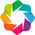

In [131]:
import holoviews as hv
from holoviews import dim
hv.extension('bokeh') # backend engine 선택

항공편 예제에서도 `groupby`를 이용해서 **edge 수**를 집계했듯이 pose 데이터셋에 대해서도 `acc`수를 `cluster`와 `pair_cluster`를 기준으로 집계해서 edge 정보를 정리해줍니다.

In [132]:
edges = df_chord.groupby(["cluster", "pair_cluster"]).acc.count().reset_index()

In [133]:
edges

,cluster,pair_cluster,acc
0,1,1,1764
1,1,2,1764
2,1,3,1596
3,1,4,1302
4,1,5,1218
...,...,...,...
395,20,16,675
396,20,17,650
397,20,18,650
398,20,19,650


다음으로 공항정보를 저장했듯이 pose데이터가 속해있는 cluster의 아이디를 각 centroid pose(`cp_N`) 이름으로 매칭해서 저장해줍니다. 각 노드(pose 데이터)가 속해있는 `cluster_id`를 기준으로 edge 데이터셋에서 `cluster`와 매칭되는 것을 알 수 있습니다.

In [134]:
# node
nodes = pd.DataFrame({"cluster_id":[x+1 for x in range(20)],
                     "name":["cp_{}".format(i+1) for i in range(20)]})
node_dataset = hv.Dataset(nodes, "cluster_id", "name" )

In [135]:
nodes.head(3)

,cluster_id,name
0,1,cp_1
1,2,cp_2
2,3,cp_3


In [136]:
chord = hv.Chord((edges, node_dataset),
                 ["cluster", "pair_cluster"],
                 ['acc'])

In [137]:
chord

:Chord   [cluster,pair_cluster]   (acc)

In [138]:
%%opts Chord [height=800 width=800 ]

chord.opts(
    cmap='Category20',
    labels='name',
    edge_color=dim("cluster").astype(str),
    edge_alpha=0.7,
    node_color=dim("cluster_id").astype(str))

:Chord   [cluster,pair_cluster]   (acc)

![](../../images/chord5.png)

**Reference**

- [CHORD DIAGRAM](https://www.data-to-viz.com/graph/chord.html)

- [Chord diagram (information visualization)](https://en.wikipedia.org/wiki/Chord_diagram_(information_visualization))